# Week 4 - Classification

This week, we shift from gathering human textual classifications through crowdsourcing, to using machine learning models and algorithms that train on those human classifications and extend them to documents far too numerous to read. If you recall, *clustering* allows us to stably partition text data (e.g., documents, turns of conversation) according to all patterns of covariation among available text features. *Classification*, by contrast, partitions text data according to only those features and their variation that enable us to mimic and extrapolate human annotations.

In this notebook, we will show how to use a variety of classification methods, including Naïve Bayes, Logistic regression, K-nearest neighbor, decision trees and random forests, support vector machines and even a simple neural network, the perceptron. We will also demonstrate ensemble techniques that can link several such methods into a single, more accurate, classification pipeline. We will finally learn to use conventions and metrics to evaluate classifier performance on out-of-sample data. 

For this notebook we will be using the following packages.

In [2]:
#Special module written for this class
#This provides access to data and to helper functions from previous weeks
#Make sure you update it before starting this notebook
import lucem_illud #pip install -U git+git://github.com/UChicago-Computational-Content-Analysis/lucem_illud.git

#All these packages need to be installed from pip
#For ML
import sklearn
import sklearn.naive_bayes
import sklearn.tree
import sklearn.ensemble
import sklearn.neural_network
import sklearn.decomposition

import numpy as np #arrays
import pandas as pd
import matplotlib.pyplot as plt #Plots
import matplotlib.colors # For nice colours
import seaborn #Makes plots look nice, also heatmaps
import scipy as sp #for interp

#These are from the standard library
import collections
import os
import os.path
import random
import re
import glob
import pandas
import requests
import json
import math

#This 'magic' command makes the plots work better
#in the notebook, don't use it outside of a notebook.
#Also you can ignore the warning
%matplotlib inline

# Simple Simulated Examples

Here we create a sandbox for you to explore different types of classified data and how different statistical classifiers perform on each type.

## Generating example data

We start by loading one of the "cartoon" or simplified data sets and then dividing it into training and testing sets. To maximize our ability to visualize, each dataset involves two classes, colored yellow and blue, arrayed along two dimensions (`x` and `y`). 

The four data patterns include: 
+ `random` in which the two classes are randomly distributed across both dimensions
+ `andSplit` in which the two classes are linearly split along one of two dimensions (e.g., men like Adidas)
+ `xorSplit` in which the two classes are split, oppositely, along each dimension (e.g., old ladies and young men like Nikes)
+ `targetSplit` in which one class is nested within the other in two dimensions (e.g., middle aged, middle income people like vintage Mustangs)
+ `multiBlobs` in which 5 classes are placed as bivariate Gaussians at random locations

`noise` is a variable [0-1] that ranges from no noise in the prescribed pattern [0] to complete noise/randomness [1].

Uncomment (remove the # in front of) each dataset, one at a time, and then run the cell and subsequent cells to examine how each machine learning approach captures each pattern.

In [95]:
noise = .2

#dfTrain, dfTest = lucem_illud.trainTestSplit(lucem_illud.random())
#dfTrain, dfTest = lucem_illud.trainTestSplit(lucem_illud.andSplit(noise))
dfTrain, dfTest = lucem_illud.trainTestSplit(lucem_illud.xorSplit(noise)) #Please try this one
#dfTrain, dfTest = lucem_illud.trainTestSplit(lucem_illud.targetSplit(noise))
#dfTrain, dfTest = lucem_illud.trainTestSplit(lucem_illud.multiBlobs(noise))

We can easily visualize the rendered datasets because they are generated in two dimensions.

Let's see what dfTrain, a simulated data that we just made, looks like

In [8]:
dfTrain.head()

,vect,category
491,"[-0.6412631709995937, -0.524482393700151]",1
918,"[0.683607815800669, -0.5535885041445976]",0
642,"[-0.06603538661312901, 0.2730487867202467]",0
965,"[-0.05678855949564882, -0.6118160162904696]",1
833,"[-0.31630973414750463, -0.5527567528414208]",1


So, dfTrain has two columns, vect and category. 

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


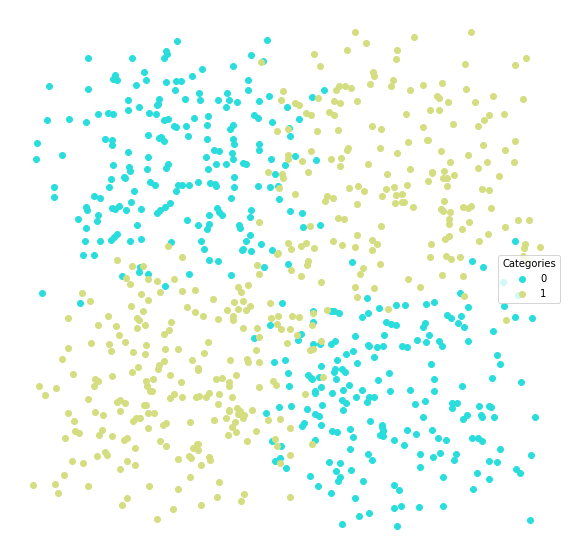

In [96]:
lucem_illud.plotter(dfTrain)

## Training a Machine Learning algorithm

We can now pick a model, there are many more options in `scikit-learn`. These are just a few examples, which array along the machine learning "tribes" described in Pedro Domingos _The Master Algorithm_.

Uncomment (remove the # in front of) each algorithm one at a time, then run the cell and subsequent cells to evaluate how it learns to understand the data.

In [37]:
#Bayes
#clf = sklearn.naive_bayes.GaussianNB()

#Analogizes
#clf = sklearn.svm.SVC(kernel = 'linear', probability = True) #slow, set probability = False to speed up
#clf = sklearn.svm.SVC(kernel = 'poly', degree = 3, probability = True) #slower
#clf = sklearn.neighbors.KNeighborsClassifier(5, weights='distance')# k, 'distance' or 'uniform'

#Classical Regression
#clf = sklearn.linear_model.LogisticRegression()

#Symbolists
#clf = sklearn.tree.DecisionTreeClassifier()
#clf = sklearn.ensemble.RandomForestClassifier()

#Connectionists
#clf = sklearn.neural_network.MLPClassifier()

#Ensemble
clf = sklearn.ensemble.GradientBoostingClassifier()

We're using sklearn here. What is sklearn? It's an open source machine learning library for Python. We use sklearn because it features various machine learning algorithms and it works well with NumPy library. You don't need to understand the sklearn package in detail for the moment, but let's see what methods and attributes sklearn has, because we're going to use some of them:

In [17]:
dir(sklearn)

['__SKLEARN_SETUP__',
 '__all__',
 '__builtins__',
 '__cached__',
 '__check_build',
 '__doc__',
 '__file__',
 '__loader__',
 '__name__',
 '__package__',
 '__path__',
 '__spec__',
 '__version__',
 '_config',
 '_distributor_init',
 '_loss',
 'base',
 'clone',
 'config_context',
 'datasets',
 'decomposition',
 'dummy',
 'ensemble',
 'exceptions',
 'externals',
 'feature_extraction',
 'get_config',
 'linear_model',
 'logger',
 'logging',
 'metrics',
 'model_selection',
 'naive_bayes',
 'neighbors',
 'neural_network',
 'os',
 'preprocessing',
 'random',
 'set_config',
 'setup_module',
 'show_versions',
 'svm',
 'sys',
 'tree',
 'utils']

Now we fit the model by giving it our training data

In [38]:
clf.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])

GradientBoostingClassifier()

Here, "stack" function is used. Why did we use stack function here? This is because dfTrain['vect'] is a sequence, while clf.fit() takes an array element. Let's see what dfTrain['vect'] looks like:

In [24]:
dfTrain['vect'].values

array([array([ 6.29680154, -0.06436071]), array([1.83375901, 7.93668895]),
       array([-5.31539844, -6.89412655]), ...,
       array([ 7.45063717, -0.46103134]),
       array([-3.98813346, -8.3158543 ]),
       array([-6.24513585, -7.44861509])], dtype=object)

And let's see what np.stack(dfTrain['vect']) does:

In [25]:
np.stack(dfTrain['vect'])

array([[ 6.29680154, -0.06436071],
       [ 1.83375901,  7.93668895],
       [-5.31539844, -6.89412655],
       ...,
       [ 7.45063717, -0.46103134],
       [-3.98813346, -8.3158543 ],
       [-6.24513585, -7.44861509]])

As you can see, stack function takes a sequence of arrays (which have the same shape) and joins them along a new axis.

## Algorithm evaluation

We can look at few measurements of each classifier's performance by using the testing set

In [33]:
print("Naive Bayes")
lucem_illud.evaluateClassifier(clf, dfTest)

Naive Bayes


,Error_Rate,AUC,Precision,Average_Precision,Recall
Category,,,,,
0,0.094,0.865324,0.745283,0.634721,0.797980
1,0.022,0.962562,0.947368,0.900158,0.937500
2,0.022,0.967500,0.940594,0.903564,0.950000
3,0.094,0.847261,0.797980,0.648721,0.745283
4,0.000,1.000000,1.000000,1.000000,1.000000


In [30]:
print("Linear Kernel SVM")
lucem_illud.evaluateClassifier(clf, dfTest)

Linear Kernel SVM


,Error_Rate,AUC,Precision,Average_Precision,Recall
Category,,,,,
0,0.094,0.872931,0.736364,0.638479,0.818182
1,0.022,0.962562,0.947368,0.900158,0.937500
2,0.022,0.967500,0.940594,0.903564,0.950000
3,0.094,0.840365,0.810526,0.646779,0.726415
4,0.000,1.000000,1.000000,1.000000,1.000000


In [36]:
print("K-nearest Neighbors")
lucem_illud.evaluateClassifier(clf, dfTest)

K-nearest Neighbors


,Error_Rate,AUC,Precision,Average_Precision,Recall
Category,,,,,
0,0.124,0.816192,0.676190,0.540945,0.717172
1,0.024,0.965295,0.928571,0.890208,0.947917
2,0.024,0.958750,0.948980,0.896551,0.930000
3,0.124,0.804090,0.720000,0.557057,0.679245
4,0.000,1.000000,1.000000,1.000000,1.000000


In [59]:
print("Gradient Boost")
lucem_illud.evaluateClassifier(clf, dfTest).reset_index()

Gradient Boost


,Category,Error_Rate,AUC,Precision,Average_Precision,Recall
0,Clinton,0.005865,0.993685,0.99537,0.993695,0.99537
1,Obama,0.005865,0.993685,0.99200,0.986997,0.99200


This lets us look at which classes do better:

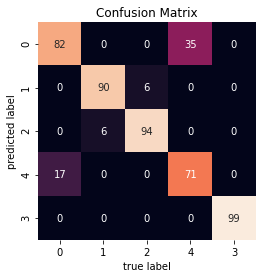

In [40]:
lucem_illud.plotConfusionMatrix(clf, dfTest)

The greater the area under the curve the better.

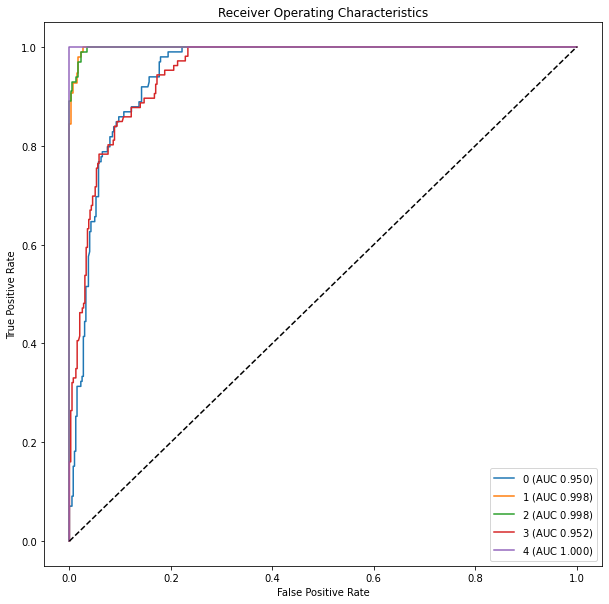

In [41]:
lucem_illud.plotMultiROC(clf, dfTest)

We can also look at the regions the classifer identifies as one class or the other:

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

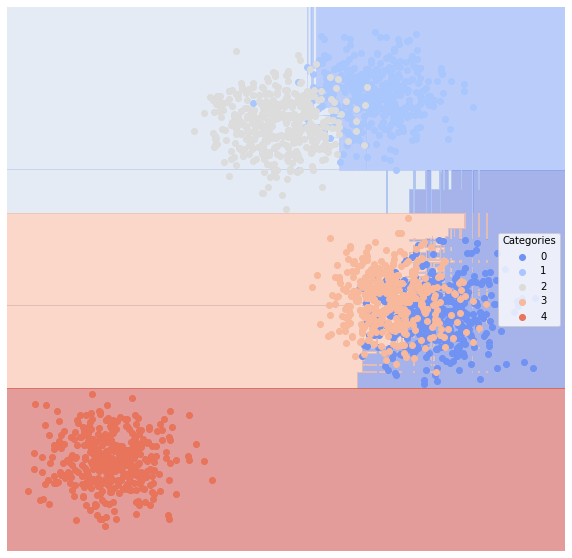

In [42]:
lucem_illud.plotregions(clf, dfTrain)

## Now we do the same for real data

Available data sets include:
+ Reddit threads "classified" by thread topic
+ 20 newsgroups "classified" by group topic
+ Senate press releases "classified" by Senator (2 senators)
+ Senate press releases "classified" by Senator (5 senators)
+ Emails classified as Spam or Ham

In [2]:
#dfTrain, dfTest = lucem_illud_2020.trainTestSplit(lucem_illud_2020.loadReddit())
#dfTrain, dfTest = lucem_illud.trainTestSplit(lucem_illud.loadNewsGroups())
dfTrain, dfTest = lucem_illud.trainTestSplit(lucem_illud.loadSenateSmall())
#dfTrain, dfTest = lucem_illud.trainTestSplit(lucem_illud.loadSenateLarge())
#dfTrain, dfTest = lucem_illud.trainTestSplit(lucem_illud.loadSpam())

Loading senate data
Converting to vectors


In [53]:
#Bayes
#clf = sklearn.naive_bayes.GaussianNB()

#Analogizes
#clf = sklearn.svm.SVC(kernel = 'linear', probability = True) #slow, set probability = False to speed up, but lose ROC
#clf = sklearn.svm.SVC(kernel = 'poly', degree = 3, probability = True) #slower
#clf = sklearn.neighbors.KNeighborsClassifier(5, weights='distance')# k, 'distance' or 'uniform'

#Classical Regression
#clf = sklearn.linear_model.LogisticRegression()

#Symbolists
#clf = sklearn.tree.DecisionTreeClassifier()
clf = sklearn.ensemble.RandomForestClassifier()

#Connectionists
#clf = sklearn.neural_network.MLPClassifier()

#Ensemble
#clf = sklearn.ensemble.GradientBoostingClassifier()

In [54]:
clf.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])

RandomForestClassifier()

In [55]:
lucem_illud.evaluateClassifier(clf, dfTest)

,Error_Rate,AUC,Precision,Average_Precision,Recall
Category,,,,,
Clinton,0.005865,0.993685,0.99537,0.993695,0.99537
Obama,0.005865,0.993685,0.99200,0.986997,0.99200


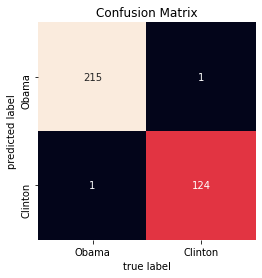

In [56]:
lucem_illud.plotConfusionMatrix(clf, dfTest)

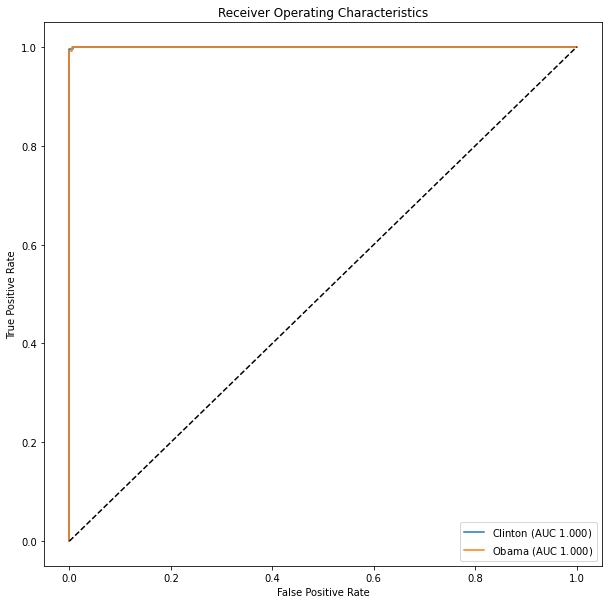

In [57]:
lucem_illud.plotMultiROC(clf, dfTest)

## <span style="color:red">*Exercise 1*</span>

<span style="color:red">Go back through all of the cells above and generate 10 distinct artificial datasets and classify them with all of the available methods. Add a cell immediately below and describe which classifier(s) worked best with which artificially constructed data source and why. Then go through all of the empirical datasets (i.e., Newsgroups, Senate Small, Senate Large, Email Spam) and classify them with all available methods. Add a second cell immediately below and describe which classifier(s) worked best with which data set and why.

<span style="color:red">***Stretch*** (but also required) Wander through the SKLearn documentation available [here](http://scikit-learn.org/stable/), particularly perusing the classifiers. In cells following, identify and implement a new classifier that we have not yet used (e.g., AdaBoost, CART) on one artificial dataset and one real dataset (used above). Then, in the next cell describe the classifier, detail how it compares with the approaches above, and why it performed better or worse than others.

In [109]:
def generate_classify(dfTrain, dfTest):
    """ 
    Grid search over different classification algorithms and 
    save classifier with highest average AUC values.

    :param dfTrain: dataframe with training set.
    :param dfTest: dataframe with test set
    :return tuple: dictionary with name of best classification algorithm and
                  average auc achieved.
    """
    classifiers = {"Naive Bayes": sklearn.naive_bayes.GaussianNB(), 
                   "Linear SVM": sklearn.svm.SVC(kernel = 'linear', probability = True),
                   "Polynomial SVM": sklearn.svm.SVC(kernel = 'poly', degree = 3, probability = True),  
                   "K-Nearest-Nieghbors": sklearn.neighbors.KNeighborsClassifier(5, weights='distance'), 
                   "Logistic Regression": sklearn.linear_model.LogisticRegression(), 
                   "Decision Tree": sklearn.tree.DecisionTreeClassifier(),
                   "Random Forest": sklearn.ensemble.RandomForestClassifier(),
                   "MLP Classifier": sklearn.neural_network.MLPClassifier(),
                   "Gradient Boost": sklearn.ensemble.GradientBoostingClassifier(),
                   "Adaboost": sklearn.ensemble.AdaBoostClassifier(n_estimators=100, random_state=0)}
                   #"Lasso Lars": sklearn.linear_model.LassoLars(alpha=.1)}

    best = None
    best_auc = 0.0

    for classifier, clf in classifiers.items():
        print(classifier+":")
        clf.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
        results = lucem_illud.evaluateClassifier(clf, dfTest)
        print(results)
        avg_auc = results.reset_index()["AUC"].values.mean()

        if avg_auc > best_auc:
            best_auc = avg_auc
            best = classifier
    return (best, best_auc)

In [92]:
# Generate 10 artificial datasets and run different classication methods

dfTrain, dfTest = lucem_illud.trainTestSplit(lucem_illud.random())
n=0
data_gen = {"Random": lucem_illud.trainTestSplit(lucem_illud.random()),
            "andSplit": lucem_illud.trainTestSplit(lucem_illud.andSplit(n)),
            "xorSplit": lucem_illud.trainTestSplit(lucem_illud.xorSplit(n)),
            "targetSplit": lucem_illud.trainTestSplit(lucem_illud.targetSplit(n)), 
            "multiBlobs": lucem_illud.trainTestSplit(lucem_illud.multiBlobs(n))}


noise = [.1, .8]

summary_df = pd.DataFrame(columns = ["data_desc", "classifier", "avg_auc"])
for n in noise:
    for sim_type, generator in data_gen.items():
        print(sim_type)
        if sim_type == "Random":
            n_keep = None
        else:
            n_keep = n
        print("Noise level: ", n)

        dfTrain, dfTest = generator
        (classifier, auc_val) = generate_classify(dfTrain, dfTest)

        summary_df = summary_df.append({"data_desc": (sim_type, n_keep),
                                        "classifier": classifier,
                                        "avg_auc": auc_val}, ignore_index=True)


       1.0                1.0     1.0
4                0.0  1.0        1.0                1.0     1.0
K-Nearest-Nieghbors:
          Error_Rate  AUC  Precision  Average_Precision  Recall
Category                                                       
0                0.0  1.0        1.0                1.0     1.0
1                0.0  1.0        1.0                1.0     1.0
2                0.0  1.0        1.0                1.0     1.0
3                0.0  1.0        1.0                1.0     1.0
4                0.0  1.0        1.0                1.0     1.0
Logistic Regression:
          Error_Rate  AUC  Precision  Average_Precision  Recall
Category                                                       
0                0.0  1.0        1.0                1.0     1.0
1                0.0  1.0        1.0                1.0     1.0
2                0.0  1.0        1.0                1.0     1.0
3                0.0  1.0        1.0                1.0     1.0
4                0.0  1.

In [93]:
summary_df

,data_desc,classifier,avg_auc
0,"(Random, None)",MLP Classifier,0.578131
1,"(andSplit, 0.1)",Decision Tree,1.000000
2,"(xorSplit, 0.1)",Gradient Boost,1.000000
3,"(targetSplit, 0.1)",K-Nearest-Nieghbors,0.975148
4,"(multiBlobs, 0.1)",Naive Bayes,1.000000
5,"(Random, None)",MLP Classifier,0.562625
6,"(andSplit, 0.8)",Decision Tree,1.000000
7,"(xorSplit, 0.8)",Gradient Boost,1.000000
8,"(targetSplit, 0.8)",MLP Classifier,0.975248
9,"(multiBlobs, 0.8)",Naive Bayes,1.000000


In the above dataframe we can see the 10 different simulated datasets, the method used to generate
each dataset and the classifier that had the highest average AUC for each dataset. In addition to testing
all classifiers used above, I added a Lasso classifier, which on average performed poorly with on datasets 
that cannot be linearly separated. For the random dataset we see that the best classifier is the 
simple MLP neural network. This is perhaps because Neural networks can find decision boundaries to best
separate non-linear datasets. For both andSplit datasets the best classifier was a Decision Tree which makes
sense since these datasets are separable among dimensions and form non overlaping clusters. For the XorSplit 
datasets the best algorithm was Gradient Boost this is probably due to the fact that Gradient Boost builds 
decision boundaries based on ensembles of simpler tree models which perform well on datasets that are XorSplit
across each dimension. The targetSplit datasets where best predicted using K-neares neighbors that although it 
is a simple algorithm performs well on datasets that hce nested clases since it predicts labels based on the closest
neighbors.


In [110]:
# Run through each real dataset 
#dfTrain, dfTest = lucem_illud_2020.trainTestSplit(lucem_illud_2020.loadReddit())
#dfTrain, dfTest = lucem_illud_2020.trainTestSplit(lucem_illud_2020.loadNewsGroups())
#dfTrain, dfTest = lucem_illud.trainTestSplit(lucem_illud.loadSenateSmall())
#dfTrain, dfTest = lucem_illud.trainTestSplit(lucem_illud.loadSenateLarge())
#dfTrain, dfTest = lucem_illud_2020.trainTestSplit(lucem_illud_2020.loadSpam())
data_gen = {"Reddit": lucem_illud.trainTestSplit(lucem_illud.loadReddit()),
            "NewsGroup":lucem_illud.trainTestSplit(lucem_illud.loadNewsGroups()),
            "SmallSenate": lucem_illud.trainTestSplit(lucem_illud.loadSenateSmall())}
            "LargeSenate":  lucem_illud.trainTestSplit(lucem_illud.loadSenateLarge()), 
            "Spam": lucem_illud.trainTestSplit(lucem_illud.loadSpam())}


summary_df = pd.DataFrame(columns = ["data_desc", "classifier", "avg_auc"])
for sim_type, generator in data_gen.items():
    print(sim_type)
    if sim_type == "Random":
        n_keep = None
    else:
        n_keep = n
    print("Noise level: ", n)

    dfTrain, dfTest = generator
    (classifier, auc_val) = generate_classify(dfTrain, dfTest)

    summary_df = summary_df.append({"data_desc": (sim_type, n_keep),
                                    "classifier": classifier,
                                    "avg_auc": auc_val}, ignore_index=True)

Loading Reddit data
Converting to vectors
Loading data for: comp.sys.mac.hardware
Loading data for: comp.windows.x
Loading data for: misc.forsale
Loading data for: rec.autos
Converting to vectors
Loading senate data
Converting to vectors
Reddit
Noise level:  0
Naive Bayes:
                         Error_Rate       AUC  Precision  Average_Precision  \
Category                                                                      
Bad Roommates              0.169279  0.760011   0.736111           0.553058   
Weeaboo Tales              0.166144  0.881370   0.598425           0.589351   
Tales From Tech Support    0.053292  0.905412   0.921875           0.803683   
Relationships              0.163009  0.734769   0.767857           0.524914   

                           Recall  
Category                           
Bad Roommates            0.602273  
Weeaboo Tales            0.974359  
Tales From Tech Support  0.830986  
Relationships            0.524390  
Linear SVM:
                       

In [111]:
summary_df

,data_desc,classifier,avg_auc
0,"(Reddit, 0)",Linear SVM,0.980018
1,"(NewsGroup, 0)",Logistic Regression,0.921079
2,"(SmallSenate, 0)",Gradient Boost,0.991453


For the real world datasets in addition to evaluating all of the classifiers from above I also
tried an Adaboost classifier. In the table above we see the otput of a grid search across classifiers
for each dataset. We see that for the Reddit dataset the classifier with the highest average 
auc was the Linear SVM. This could be surprising since Linear SVMs , as their name predict, tend to only perform
well with datasets that have linear classification boundaries which it seems was the case with the Reddit dataset. 
Furthermore, for the NewsGroup dataset which had 4 different classes we see that the classifier with the highest 
auc was the Logistic Regression classifier. We can speculate that this is because the Newsgroup dataset's different 
classes can be linearly separated  and it is a low dimensional dataset. On the other hand, the Small Senate 
dataset which is a high dimensional dataset was best predicted by the Gradient Boost algorithm which 
as we noted above performs well with more complex decision boundaries since it uses tree ensembles. The additional classifier
that we used, Adaboost, performed among the best classifiers with the both the Reddit and Small Senate dataset but had 
a lower auc with the NewsGroup dataset.

# Clinton / Obama Press Releases

We often will not have nicely prepared data, so we will work though the proccess of cleaning and structuring in more detail here:

While the Clinton and Obama Senatorial Press Releases are not hand-coded, we can imagine that we have been given a stack of such press releases, but lost the metadata associated with which senatorial office issued which. If we label a few of them, how well can our classifier do at recovering the rest? 

In [98]:
ObamaClintonReleases = pandas.read_csv('../data/ObamaClintonReleases.csv', index_col=0)

I'm pretty sure that you're all familiar with pandas, but, just to clarify: why do we use pandas here? pandas is a Python library which is widely used for analyzing and wrangling data. In particular, pandas loads data and creates data frame, a Python object that looks familiar to us (since it looks like a excel table) and easy to work with. So, using pandas.read_csv function, we take in the csv file and convert it into a data frame. 

In [99]:
type(ObamaClintonReleases)

pandas.core.frame.DataFrame

It's a DataFrame! and it looks like this:

In [100]:
ObamaClintonReleases.head()

,download_url,html_url,name,path,text,targetSenator
0,https://raw.githubusercontent.com/lintool/Grim...,https://github.com/lintool/GrimmerSenatePressR...,10Apr2007Obama430.txt,raw/Obama/10Apr2007Obama430.txt,Obama Calls on IRS to Protect Taxpayers ...,Obama
1,https://raw.githubusercontent.com/lintool/Grim...,https://github.com/lintool/GrimmerSenatePressR...,10Apr2008Obama108.txt,raw/Obama/10Apr2008Obama108.txt,Statement from Senator Barack Obama on the ...,Obama
2,https://raw.githubusercontent.com/lintool/Grim...,https://github.com/lintool/GrimmerSenatePressR...,10Aug2005Obama674.txt,raw/Obama/10Aug2005Obama674.txt,Obama Says Bill Will Help Cut Off Supply of...,Obama
3,https://raw.githubusercontent.com/lintool/Grim...,https://github.com/lintool/GrimmerSenatePressR...,10Aug2005Obama675.txt,raw/Obama/10Aug2005Obama675.txt,Obama Durbin Say Illinois Will Receive 33 ...,Obama
4,https://raw.githubusercontent.com/lintool/Grim...,https://github.com/lintool/GrimmerSenatePressR...,10Aug2006Obama508.txt,raw/Obama/10Aug2006Obama508.txt,Obama Introduces Bill to Help Tap Power of ...,Obama


Neat! Let's turn the 'targetSenator' column into a binary category variable.

In [101]:
ObamaClintonReleases['category'] = [s == 'Obama' for s in ObamaClintonReleases['targetSenator']]

Tokenize and normalize

In [102]:
ObamaClintonReleases['tokenized_text'] = ObamaClintonReleases['text'].apply(lambda x: lucem_illud.word_tokenize(x))
ObamaClintonReleases['normalized_text'] = ObamaClintonReleases['tokenized_text'].apply(lambda x: lucem_illud.normalizeTokens(x))

Let's split the data into training data and testing data.

In [103]:
holdBackFraction = .2
train_data_df, test_data_df = lucem_illud.trainTestSplit(ObamaClintonReleases, holdBackFraction=holdBackFraction)

In [105]:
train_data_df.head(3)

,download_url,html_url,name,path,text,targetSenator,category,tokenized_text,normalized_text
1670,https://raw.githubusercontent.com/lintool/Grim...,https://github.com/lintool/GrimmerSenatePressR...,1Jun2006Clinton476.txt,raw/Clinton/1Jun2006Clinton476.txt,June 1 2006 Senator Clinton Announces New Leg...,Clinton,False,"[June, 1, 2006, Senator, Clinton, Announces, N...","[june, senator, clinton, announce, new, legisl..."
1172,https://raw.githubusercontent.com/lintool/Grim...,https://github.com/lintool/GrimmerSenatePressR...,15Feb2006Clinton648.txt,raw/Clinton/15Feb2006Clinton648.txt,February 15 2006 Senator Clinton Spotlights N...,Clinton,False,"[February, 15, 2006, Senator, Clinton, Spotlig...","[february, senator, clinton, spotlight, need, ..."
1258,https://raw.githubusercontent.com/lintool/Grim...,https://github.com/lintool/GrimmerSenatePressR...,16Dec2005Clinton31.txt,raw/Clinton/16Dec2005Clinton31.txt,December 16 2005 Statement of Senator Hillary...,Clinton,False,"[December, 16, 2005, Statement, of, Senator, H...","[december, statement, senator, hillary, rodham..."


In [107]:
test_data_df.head(3)

,download_url,html_url,name,path,text,targetSenator,category,tokenized_text,normalized_text
599,https://raw.githubusercontent.com/lintool/Grim...,https://github.com/lintool/GrimmerSenatePressR...,5Apr2006Obama558.txt,raw/Obama/5Apr2006Obama558.txt,Obama Statement on Final Passage of Lobbyin...,Obama,True,"[Obama, Statement, on, Final, Passage, of, Lob...","[obama, statement, final, passage, lobby, refo..."
1706,https://raw.githubusercontent.com/lintool/Grim...,https://github.com/lintool/GrimmerSenatePressR...,1Sep2005Clinton287.txt,raw/Clinton/1Sep2005Clinton287.txt,September 1 2005 Senator Clinton Joins Local ...,Clinton,False,"[September, 1, 2005, Senator, Clinton, Joins, ...","[september, senator, clinton, join, local, com..."
1634,https://raw.githubusercontent.com/lintool/Grim...,https://github.com/lintool/GrimmerSenatePressR...,1Aug2005Clinton329.txt,raw/Clinton/1Aug2005Clinton329.txt,August 1 2005 Clinton Lowey Call for Congres...,Clinton,False,"[August, 1, 2005, Clinton, Lowey, Call, for, C...","[august, clinton, lowey, congressional, action..."


In [118]:
print(len(train_data_df))
print(len(test_data_df))

1368
341


## Logistic Regression

First, let's try with a logistic regression, which may be familiar to you from statistical methods classes. First, we must turn the training dataset into a tf-idf matrix (`lucem_illud_2020.generateVecs()` will help with this but for now we are doing it the long way):

In [108]:
TFVectorizer = sklearn.feature_extraction.text.TfidfVectorizer(max_df=100, min_df=2, stop_words='english', norm='l2')
TFVects = TFVectorizer.fit_transform(train_data_df['text'])

The core function here is TfidfVectorizer, which takes a collection of raw documents and turn them to a tf-idf matrix. Just to recap: tf-idf means term frequency-inverse document frequency, a statistic (or, more precisely, a product of two statistics, term frequency and inverse document frequency) that shows the importance of a term vis-a-vis documents. TF, or, term frequency, counts how many times a term is used in a document; IDF, or, inverse-document-frequency, measures common or rare a term appears across documents. 

Let's look at three parameters of TfidfVectorizer: max_df = 100, min_df = 2, and norm='l2'. What do those parameters mean? 

(1) max_df = 100

Here, we specified a thredhold of 100, and the terms that have a document frequency higher than 100 would be ignored.

(2) min_df = 2

We specified a lower bound, 2, and the terms that have a document frequency lower than 2 will be ignored.

(3) norm = 'l2'

This parameter is about vector normalization. In machine learning, we commonly normalize vectors, i.e., change the length of vectors and turn them into a unit vector, before passing them into algorithms. There are various ways of normalizations, and this parameter specifies how we normalize vectors. Here, we set the norm to l2, in which case, we normalize the vectors such that squares of vector elements sums to 1. Alternatively, we can set it to l1, in which case the sum of absolute values of vector elements, not the square of vector elements, is 1. 

fit_transform() literally fits to data and then transform it. So, fit_transform() is just a combination of two steps--(1) fitting parameters to data; (2) then, using the vocabulary and document frequencies learned by fit(), transforming documents into document-term matrix. So, it's the same as fit followed by transform. 

Note that we can use the CountVectorizer instead, which simply produces a matrix of word counts.

In [121]:
TFVects.shape

(1368, 11410)

We can save this in the dataframe to make things easier

In [109]:
train_data_df['vect'] = [np.array(v).flatten() for v in TFVects.todense()]

In [111]:
train_data_df.head(2)

,download_url,html_url,name,path,text,targetSenator,category,tokenized_text,normalized_text,vect
1670,https://raw.githubusercontent.com/lintool/Grim...,https://github.com/lintool/GrimmerSenatePressR...,1Jun2006Clinton476.txt,raw/Clinton/1Jun2006Clinton476.txt,June 1 2006 Senator Clinton Announces New Leg...,Clinton,False,"[June, 1, 2006, Senator, Clinton, Announces, N...","[june, senator, clinton, announce, new, legisl...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
1172,https://raw.githubusercontent.com/lintool/Grim...,https://github.com/lintool/GrimmerSenatePressR...,15Feb2006Clinton648.txt,raw/Clinton/15Feb2006Clinton648.txt,February 15 2006 Senator Clinton Spotlights N...,Clinton,False,"[February, 15, 2006, Senator, Clinton, Spotlig...","[february, senator, clinton, spotlight, need, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."


Looks simple, but we need to know what todense() does here. todense() returns a dense matrix representation of the matrix. Why do we need this? As you can see above, the TFVects, a document-term matrix, has 11349 columns, and this matrix is sparse, in the sense that it is comprised mostly of zeros. Dense matrices, in contrast, are the matrices that are comprised of mostly non-zeros. Then why do we make sparse matrices into dense ones? Because zero values don't contain important information but take up so much memory.

In a regression, we cannot have more variables than cases. So, we need to first do a dimension reduction. First, we will approah this with PCA. You have previously seen this in week 3. Here we are not concerned about visualization, but rather classification and so all principal components are calculated. Watch out: we have to use `stack` not `sum` for combining the vectors. We note that you could also use topic loading and embedding dimensions as featured variables.

In [120]:
pca = sklearn.decomposition.PCA()
reduced_data = pca.fit_transform(np.stack(train_data_df['vect'], axis=0))

We can store the PCA space vectors in the dataframe too:

In [121]:
train_data_df['pca'] = [r for r in reduced_data]

Visualization in 2D:

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


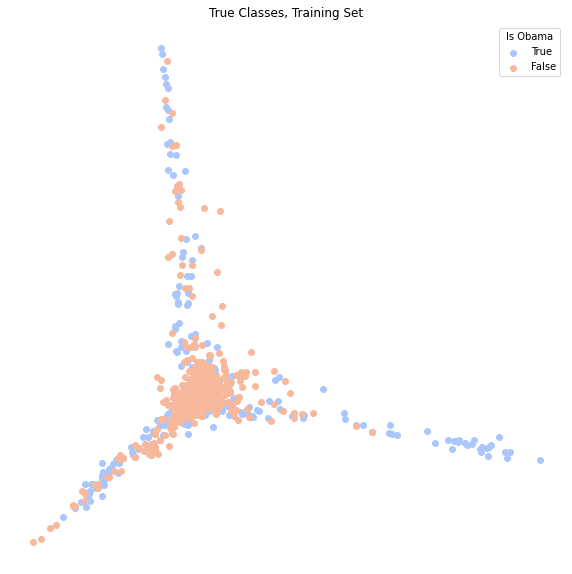

In [122]:
fig, ax = plt.subplots(figsize = (10,10))
ax.axis('off')
pallet = seaborn.color_palette(palette='coolwarm', n_colors = 2)

#Plot Obama
a = np.stack(train_data_df[train_data_df['category']]['pca'])
ax.scatter(a[:,0], a[:, 1], c = pallet[0], label = "True")

#Plot not Obama
a = np.stack(train_data_df[train_data_df['category'].eq(False)]['pca'])
ax.scatter(a[:,0], a[:, 1], c = pallet[1], label = "False")
    
ax.legend(loc = 'upper right', title = 'Is Obama')
plt.title('True Classes, Training Set')
plt.show()

PCA cannot distinguish Obama very well. Let's perform a screeplot to see how many Principal Components we need.

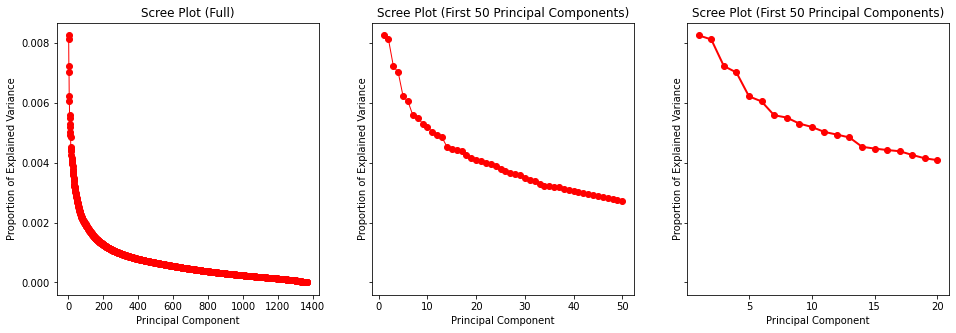

In [123]:
n = len(train_data_df)

fig, (ax1, ax2, ax3) = plt.subplots(ncols=3, figsize = (16, 5), sharey=True)

eigen_vals = np.arange(n) + 1
ax1.plot(eigen_vals, pca.explained_variance_ratio_, 'ro-', linewidth=1)
ax1.set_title('Scree Plot (Full)')
ax1.set_xlabel('Principal Component')
ax1.set_ylabel('Proportion of Explained Variance')

eigen_vals = np.arange(50) + 1
ax2.plot(eigen_vals, pca.explained_variance_ratio_[:50], 'ro-', linewidth=1)
ax2.set_title('Scree Plot (First 50 Principal Components)')
ax2.set_xlabel('Principal Component')
ax2.set_ylabel('Proportion of Explained Variance')


eigen_vals = np.arange(20) + 1
ax3.plot(eigen_vals, pca.explained_variance_ratio_[:20], 'ro-', linewidth=2)
ax3.set_title('Scree Plot (First 50 Principal Components)')
ax3.set_xlabel('Principal Component')
ax3.set_ylabel('Proportion of Explained Variance')

plt.show()

Let's choose the first 10 pricipal components as our covariates.

In [124]:
train_data_df['pca_reduced_10'] = train_data_df['pca'].apply(lambda x: x[:10])

Now we fit a logistic regression to our data.

In [125]:
logistic = sklearn.linear_model.LogisticRegression()
logistic.fit(np.stack(train_data_df['pca_reduced_10'], axis=0), train_data_df['category'])

LogisticRegression()

Let's see how the logistic regression performs on the training dataset from which we develop the model. Unfortunately, the mean accuracy is only about 64%.

In [130]:
logistic.score(np.stack(train_data_df['pca_reduced_10'], axis=0), train_data_df['category'])

0.6900584795321637

How does it perform on the testing dataset, which we "held out" and did not use for model training? We need to repeat all the steps on the testing data, but without retraining:

In [126]:
#Create vectors
TFVects_test = TFVectorizer.transform(test_data_df['text'])
test_data_df['vect'] = [np.array(v).flatten() for v in TFVects_test.todense()]

#PCA
reduced_data_test = pca.transform(np.stack(test_data_df['vect'], axis=0))
test_data_df['pca'] = [r for r in reduced_data_test]
test_data_df['pca_reduced_10'] = test_data_df['pca'].apply(lambda x: x[:10])

#Test
logistic.score(np.stack(test_data_df['pca_reduced_10'], axis=0), test_data_df['category'])

0.6744868035190615

Slightly poorer. How about using more dimensions (40)?

In [132]:
train_data_df['pca_reduced_40'] = train_data_df['pca'].apply(lambda x: x[:40])
test_data_df['pca_reduced_40'] = test_data_df['pca'].apply(lambda x: x[:40])

logistic.fit(np.stack(train_data_df['pca_reduced_40'], axis=0), train_data_df['category'])

print("Training:")
print(logistic.score(np.stack(train_data_df['pca_reduced_40'], axis=0), train_data_df['category']))
print("Testing:")
print(logistic.score(np.stack(test_data_df['pca_reduced_40'], axis=0), test_data_df['category']))

Training:
0.7171052631578947
Testing:
0.7126099706744868


Or still more (100)?

In [133]:
train_data_df['pca_reduced_100'] = train_data_df['pca'].apply(lambda x: x[:100])
test_data_df['pca_reduced_100'] = test_data_df['pca'].apply(lambda x: x[:100])

logistic.fit(np.stack(train_data_df['pca_reduced_100'], axis=0), train_data_df['category'])

print("Training:")
print(logistic.score(np.stack(train_data_df['pca_reduced_100'], axis=0), train_data_df['category']))
print("Testing:")
print(logistic.score(np.stack(test_data_df['pca_reduced_100'], axis=0), test_data_df['category']))

Training:
0.8399122807017544
Testing:
0.782991202346041


Or even more (200)!

In [134]:
train_data_df['pca_reduced_200'] = train_data_df['pca'].apply(lambda x: x[:200])
test_data_df['pca_reduced_200'] = test_data_df['pca'].apply(lambda x: x[:200])

logistic.fit(np.stack(train_data_df['pca_reduced_200'], axis=0), train_data_df['category'])

print("Training:")
print(logistic.score(np.stack(train_data_df['pca_reduced_200'], axis=0), train_data_df['category']))
print("Testing:")
print(logistic.score(np.stack(test_data_df['pca_reduced_200'], axis=0), test_data_df['category']))

Training:
0.8691520467836257
Testing:
0.7947214076246334


This is becoming ridiculous (400)!

In [135]:
train_data_df['pca_reduced_400'] = train_data_df['pca'].apply(lambda x: x[:400])
test_data_df['pca_reduced_400'] = test_data_df['pca'].apply(lambda x: x[:400])

logistic.fit(np.stack(train_data_df['pca_reduced_400'], axis=0), train_data_df['category'])

print("Training:")
print(logistic.score(np.stack(train_data_df['pca_reduced_400'], axis=0), train_data_df['category']))
print("Testing:")
print(logistic.score(np.stack(test_data_df['pca_reduced_400'], axis=0), test_data_df['category']))

Training:
0.9159356725146199
Testing:
0.8328445747800587


Increasing the number of covariates would overfit our data, and it seems that using a logistic regression, our prediction accuracy is at best about 65%. We can, however, try a logistic regression that uses the TF-IDF scores for each word, but with an L1 regularization or L1-norm loss function, which is also known as least absolute deviations (LAD), least absolute errors (LAE) or L1 penalty. It minimizes the sum of the absolute differences (S) between the target value ($Y_i$) and the estimated values ($f(x_i)$) and prunes all insignificant variables (i.e., word TF-IDF scores):

$S=\sum^n_{i=1}|y_i=f(x_i)|$

The result is a model retaining only the most individually significant features.

In [136]:
logistic_l1= sklearn.linear_model.LogisticRegression(penalty='l2')
logistic_l1.fit(np.stack(train_data_df['vect'], axis=0), train_data_df['category'])
print(logistic_l1.score(np.stack(train_data_df['vect'], axis=0), train_data_df['category']))

0.9597953216374269


Train the model using training data, and then test it on the testing data.

In [137]:
print(logistic_l1.score(np.stack(test_data_df['vect'], axis=0), test_data_df['category']))

0.8357771260997068


81% accuracy seems like the best we can get by using a logistic regression.

Now let's try with Naive Bayes. Classically, it is trained with word counts, but TF-IDF vectors are also quite good:

In [138]:
naiveBayes = sklearn.naive_bayes.BernoulliNB()
naiveBayes.fit(np.stack(train_data_df['vect'], axis=0), train_data_df['category'])

BernoulliNB()

In [139]:
print("Training:")
print(naiveBayes.score(np.stack(train_data_df['vect'], axis=0), train_data_df['category']))
print("Testing:")
print(naiveBayes.score(np.stack(test_data_df['vect'], axis=0), test_data_df['category']))

Training:
0.9656432748538012
Testing:
0.873900293255132


A bit better than the logit, but that's just looking at the accuracy. What about other measures? Let's first save the predictions in the dataframe to save use rerunning the model every time:

In [140]:
test_data_df['nb_predict'] = naiveBayes.predict(np.stack(test_data_df['vect'], axis=0))
test_data_df['nb_predict_prob_true'] = naiveBayes.predict_proba(np.stack(test_data_df['vect'], axis=0))[:,0] #other is prop false

Precision:

In [141]:
sklearn.metrics.precision_score(test_data_df['category'], test_data_df['nb_predict'])

0.8642857142857143

Recall:

In [142]:
sklearn.metrics.recall_score(test_data_df['category'], test_data_df['nb_predict'])

0.8344827586206897

F1-measure:

In [143]:
sklearn.metrics.f1_score(test_data_df['category'], test_data_df['nb_predict'])

0.8491228070175438

Let's take a look at how well our posterior distribution looks relative to the truth.

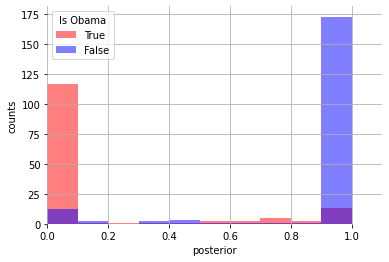

In [144]:
fig, ax = plt.subplots()
ax.grid(False)
ax.set_frame_on(False)
test_data_df[test_data_df['category'].eq(True)]['nb_predict_prob_true'].hist(alpha = 0.5, ax = ax, bins = 10, label = 'True', color = 'red')
test_data_df[test_data_df['category'].eq(False)]['nb_predict_prob_true'].hist(alpha = 0.5, ax = ax, bins = 10, label = 'False', color = 'blue')
ax.set_xlim((0,1.1))
ax.legend(title = "Is Obama")
ax.set_xlabel('posterior')
ax.set_ylabel('counts')
plt.show()

The classification is suprisingly accurate. We can even look at what words are most influential with a bit of simple math:

In [145]:
#Top indices
trueVals, falseVals = naiveBayes.feature_log_prob_

words_dict = {
    'Obama' : [],
    'Obama_log_prob' : [],
    'Clinton' : [],
    'Clinton_log_prob' : [],
}

for i, prob in sorted(enumerate(trueVals), key = lambda x:x[1], reverse=True)[:15]:
    words_dict['Obama'].append(TFVectorizer.get_feature_names()[i])
    words_dict['Obama_log_prob'].append(prob)

for i, prob in sorted(enumerate(falseVals), key = lambda x:x[1], reverse=True)[:15]:
    words_dict['Clinton'].append(TFVectorizer.get_feature_names()[i])
    words_dict['Clinton_log_prob'].append(prob)
    
pandas.DataFrame(words_dict)

,Obama,Obama_log_prob,Clinton,Clinton_log_prob
0,signature,-2.170295,5566,-1.743474
1,welcomed,-2.261267,amy,-1.795299
2,awarded,-2.322636,brundage,-1.861257
3,island,-2.335375,dick,-1.861257
4,fy,-2.348278,monday,-1.872686
5,ground,-2.374596,chicago,-2.021106
6,growing,-2.374596,location,-2.148939
7,urging,-2.374596,temporary,-2.148939
8,honor,-2.401624,writing,-2.179711
9,construction,-2.415418,va,-2.244250


## Multinomial Naive Bayes

What if we want to classify our text into one of *many* classes? The multinomial Naive Bayes generating model assumes that document features (e.g., words) are generated by draws from a multinomial distribution (recall this gives the probability to observe a particular pattern of counts across features). 

Let's use again the dataset we used in week 3, the 20 newsgroup dataset.

In [127]:
newsgroups = sklearn.datasets.fetch_20newsgroups(data_home = '../data') #Free data to play with: documents from a newsgroup corpus.
newsgroups.target_names #Possible categories, i.e., the newsgroups

['alt.atheism',
 'comp.graphics',
 'comp.os.ms-windows.misc',
 'comp.sys.ibm.pc.hardware',
 'comp.sys.mac.hardware',
 'comp.windows.x',
 'misc.forsale',
 'rec.autos',
 'rec.motorcycles',
 'rec.sport.baseball',
 'rec.sport.hockey',
 'sci.crypt',
 'sci.electronics',
 'sci.med',
 'sci.space',
 'soc.religion.christian',
 'talk.politics.guns',
 'talk.politics.mideast',
 'talk.politics.misc',
 'talk.religion.misc']

We can pick specific categories, and pull the relevant training and testing sets. 

In [128]:
target_categories = ['talk.religion.misc', 'soc.religion.christian', 'sci.space', 'comp.graphics'] #Can change these of course

newsgroupsDF = pandas.DataFrame(columns = ['text', 'category', 'source_file'])
for category in target_categories:
    print("Loading data for: {}".format(category))
    ng = sklearn.datasets.fetch_20newsgroups(categories = [category], remove=['headers', 'footers', 'quotes'], data_home = '../data')
    newsgroupsDF = newsgroupsDF.append(pandas.DataFrame({'text' : ng.data, 'category' : [category] * len(ng.data), 'source_file' : ng.filenames}), ignore_index=True)

Loading data for: talk.religion.misc
Loading data for: soc.religion.christian
Loading data for: sci.space
Loading data for: comp.graphics


Now we need to tokenize, and make a training and testing set:

In [129]:
newsgroupsDF['tokenized_text'] = newsgroupsDF['text'].apply(lambda x: lucem_illud.word_tokenize(x))
newsgroupsDF['normalized_text'] = newsgroupsDF['tokenized_text'].apply(lambda x: lucem_illud.normalizeTokens(x))

In [130]:
holdBackFraction = .2
train_ng_df, test_ng_df = lucem_illud.trainTestSplit(newsgroupsDF, holdBackFraction=holdBackFraction)

In [131]:
print(len(train_ng_df))
print(len(test_ng_df))

1723
430


In [132]:
train_ng_df.head(2)

,text,category,source_file,tokenized_text,normalized_text
1178,[Lots of trippy stuff deleted]\n\nWow... What...,sci.space,../data\20news_home\20news-bydate-train\sci.sp...,"[Lots, of, trippy, stuff, deleted, Wow, What, ...","[lot, trippy, stuff, delete, wow, guy, smoke, ..."
1515,"Press Release No.19-93\nParis, 22 April 1993\n...",sci.space,../data\20news_home\20news-bydate-train\sci.sp...,"[Press, Release, No.19, 93, Paris, 22, April, ...","[press, release, no.19, paris, april, user, es..."


In [133]:
test_ng_df.head(2)

,text,category,source_file,tokenized_text,normalized_text
2098,"\nActuallay I don't, but on the other hand I d...",comp.graphics,../data\20news_home\20news-bydate-train\comp.g...,"[Actuallay, I, do, n't, but, on, the, other, h...","[actuallay, hand, support, idea, have, newsgro..."
1027,Here are some recent observations taken by the...,sci.space,../data\20news_home\20news-bydate-train\sci.sp...,"[Here, are, some, recent, observations, taken,...","[recent, observation, take, hubble, space, tel..."


We need to extract features from the text. We can use built-in feature extraction to do so. We will use a tf-idf vectorizer, which converts the document into a vector of words with tf-idf weights (term-frequency inverse-document frequency). This gives high weight to words that show up a lot in a given document, but rarely across documents in the corpus (more distinctive). 

In [134]:
TFVectorizer_ng = sklearn.feature_extraction.text.TfidfVectorizer(max_df=100, min_df=2, stop_words='english', norm='l2')
TFVects_ng = TFVectorizer_ng.fit_transform(train_ng_df['text'])
train_ng_df['vect'] = [np.array(v).flatten() for v in TFVects_ng.todense()]

Now we can train the model:

In [135]:
MultinomialNB_ng = sklearn.naive_bayes.MultinomialNB()
MultinomialNB_ng.fit(np.stack(train_ng_df['vect'], axis = 0), train_ng_df['category'])

MultinomialNB()

...and save predictions to the dataframe:

In [137]:
train_ng_df['nb_predict'] = MultinomialNB_ng.predict(np.stack(train_ng_df['vect'], axis=0))
print("Training score:")
print(MultinomialNB_ng.score(np.stack(train_ng_df['vect'], axis=0), train_ng_df['category']))

Training score:
0.8862449216482878


In [138]:
train_ng_df[['category', 'nb_predict']][:10]

,category,nb_predict
1178,sci.space,sci.space
1515,sci.space,sci.space
1127,sci.space,sci.space
1818,comp.graphics,comp.graphics
897,soc.religion.christian,soc.religion.christian
954,soc.religion.christian,soc.religion.christian
774,soc.religion.christian,soc.religion.christian
1416,sci.space,sci.space
2089,comp.graphics,comp.graphics
326,talk.religion.misc,soc.religion.christian


Looks pretty good, lets examine the testing dataset:

In [140]:
#Create vectors
TFVects_test = TFVectorizer_ng.transform(test_ng_df['text'])
test_ng_df['vect'] = [np.array(v).flatten() for v in TFVects_test.todense()]

#Add to df
test_ng_df['nb_predict'] = MultinomialNB_ng.predict(np.stack(test_ng_df['vect'], axis=0))

#Test
print("Testing score:")
print(MultinomialNB_ng.score(np.stack(test_ng_df['vect'], axis=0), test_ng_df['category']))

Testing score:
0.7372093023255814


We can even use a confusion matrix, like we used last week for evaluating human coders relative to one another. Now we are evaluating our classifier relative to human coding. We'll just use the one in `lucem_illud_2020`, which requres a classifier and a dataframe with `'vect'` and `'category'` columns, like we have in the examples:

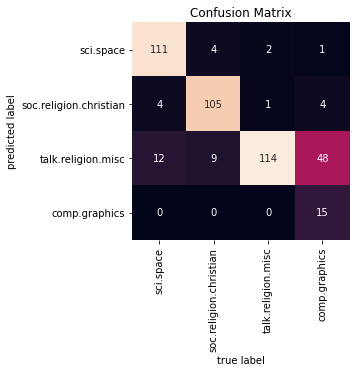

In [157]:
lucem_illud.plotConfusionMatrix(MultinomialNB_ng, test_ng_df)

Let's calculate the precision, recall, and F-measures.

In [161]:
print(sklearn.metrics.precision_score(test_ng_df['category'], test_ng_df['nb_predict'], average = 'weighted')) #precision
print(sklearn.metrics.recall_score(test_ng_df['category'], test_ng_df['nb_predict'], average = 'weighted')) #recall
print(sklearn.metrics.f1_score(test_ng_df['category'], test_ng_df['nb_predict'], average = 'weighted')) #F-1 measure

0.8582222281927219
0.8023255813953488
0.7799679281418753


We can evaluate these per catagory. This has the same requiments as `plotConfusionMatrix`:

In [162]:
lucem_illud.metrics.evaluateClassifier(MultinomialNB_ng, test_ng_df)

,Error_Rate,AUC,Precision,Average_Precision,Recall
Category,,,,,
talk.religion.misc,0.123256,0.610294,1.000000,0.343844,0.220588
sci.space,0.051163,0.930492,0.921053,0.849813,0.889831
soc.religion.christian,0.167442,0.876956,0.622951,0.613954,0.974359
comp.graphics,0.053488,0.925457,0.940678,0.859377,0.874016


We can also plot the ROC curves. This has the same requiments as `plotConfusionMatrix`:

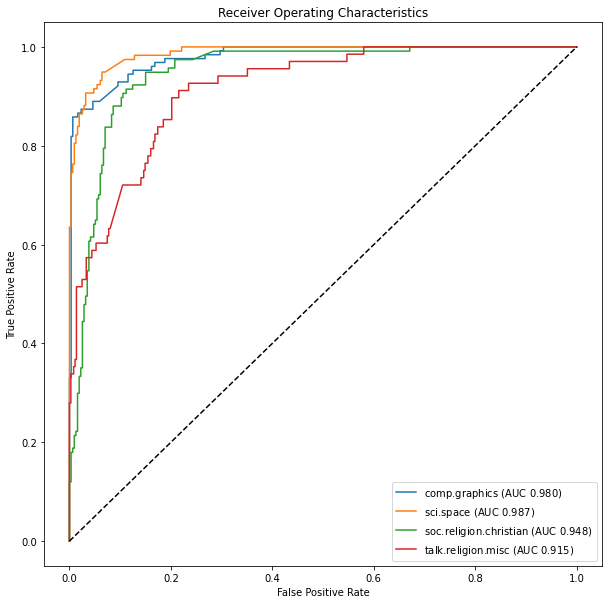

In [163]:
lucem_illud.metrics.evaluateClassifier(MultinomialNB_ng, test_ng_df)
lucem_illud.plotMultiROC(MultinomialNB_ng, test_ng_df)

And we can plot the PCA space visualization:

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

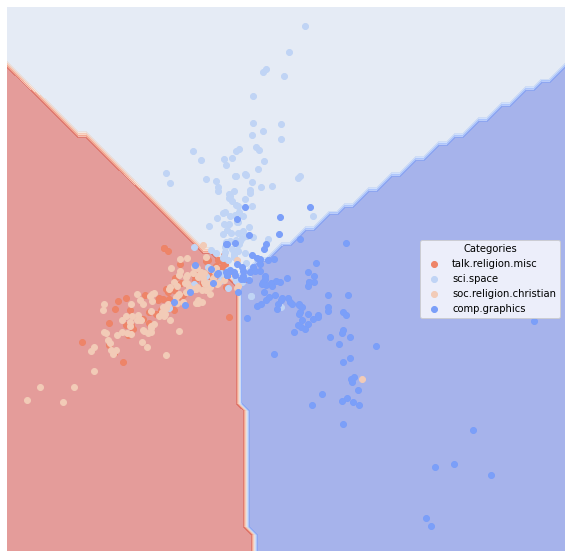

In [165]:
lucem_illud.plotregions(MultinomialNB_ng, test_ng_df)

## <span style="color:red">*Exercise 2*</span>

<span style="color:red">In the cells immediately following, perform Logistic and Naïve Bayes classification (binary or multinomial) using training, testing and extrapolation (uncoded) data from texts and hand-classifications associated with your final project (e.g., these could be crowd-sourced codes gathered through Amazon Mechanical Turk last week). Visualize the confusion matrix for training and testing sets. Calculate precision, recall, the F-measure, and AUC, then perform an ROC visualization. How do these classifiers perform? Exrapolate codes from these models to all uncoded data.


In [79]:
def clean_raw_text(raw_texts):
    """
    Clean text documents during pre-processing.
    :param raw_texts: list of raw texts to pre process.
    """

    common_stopwords = ["THE PRESIDENT:", "(Applause.)", "(applause)", "(Laughter.)"]
    stopwords = [x.lower() for x in common_stopwords]
    
    clean_texts = []
    for text in raw_texts:
        try:
            clean_text = text.replace(" \'m", 
                                      "'m").replace(" \'ll", 
                                      "'ll").replace(" \'re", 
                                      "'re").replace(" \'s",
                                      "'s").replace(" \'re", 
                                      "'re").replace(" n\'t", 
                                      "n't").replace(" \'ve", 
                                      "'ve").replace(" /'d", 
                                      "'d").replace('\n','')
            
            clean_text = clean_text.rstrip(" ").rstrip(" ' ").replace("\xa0", "")
            querywords = clean_text.split()
            resultwords  = [word for word in querywords if word.lower() not in stopwords]
            final_text = ' '.join(resultwords)

            clean_texts.append(final_text)
        except AttributeError:
            print("ERROR CLEANING")
            # print(text)
            continue
    return clean_texts

For this homework I will be using all presidential speeches from the last 4 presidents and predicting weather speeches are
{pro-climate-regulation, anti-climate-regulation, neutral}. All speeches were manually labeled. 

In [81]:
speeches = pd.read_excel(r"../data/speeches_labeled.xlsx")
speeches = speeches.drop(columns="Unnamed: 0")
speeches["Speech"] = speeches.Speech.apply(lambda row: clean_raw_text([row])[0])
speeches['tokenized_text'] = speeches['Speech'].apply(lambda x: lucem_illud.word_tokenize(x))
speeches['normalized_text'] = speeches['tokenized_text'].apply(lambda x: lucem_illud.normalizeTokens(x))
speeches.head()

,President,Date,Speech,climate_stance,tokenized_text,normalized_text
0,Joe Biden,"January 20, 2021","Chief Justice Roberts, Vice President Harris, ...",pro-climate-regulation,"[Chief, Justice, Roberts, Vice, President, Har...","[chief, justice, roberts, vice, president, har..."
1,Donald Trump,"January 19, 2021","My fellow Americans: Four years ago, we launch...",anti-climate-regulation,"[My, fellow, Americans, Four, years, ago, we, ...","[fellow, americans, year, ago, launch, great, ..."
2,Donald Trump,"January 13, 2021","My fellow Americans,I want to speak to you ton...",neutral,"[My, fellow, Americans, I, want, to, speak, to...","[fellow, americans, want, speak, tonight, trou..."
3,Donald Trump,"January 07, 2021",I would like to begin by addressing the heinou...,neutral,"[I, would, like, to, begin, by, addressing, th...","[like, begin, address, heinous, attack, unite,..."
4,Donald Trump,"January 06, 2021",I know your pain. I know your hurt.We had an e...,neutral,"[I, know, your, pain, I, know, your, hurt, We,...","[know, pain, know, hurt, election, steal, land..."


In [171]:
speeches["category"] = speeches["climate_stance"]

TFVectorizer_speech = sklearn.feature_extraction.text.TfidfVectorizer(max_df=100, min_df=2, stop_words='english', norm='l2')
TFVects = TFVectorizer_speech.fit_transform(speeches['Speech'])
speeches['vect'] = [np.array(v).flatten() for v in TFVects.todense()]

In [172]:
holdBackFraction = .2
train_speech_df, test_speech_df = lucem_illud.trainTestSplit(speeches, holdBackFraction=holdBackFraction)

In [175]:
# Logistic
print("Results using L2 Logistic Regresion:")
print()
logistic_l1 = sklearn.linear_model.LogisticRegression(penalty='l2')

logistic_l1.fit(np.stack(train_speech_df['vect'], axis=0), train_speech_df['category'])
print("Training accuracy: {}".format(logistic_l1.score(np.stack(train_speech_df['vect'], axis=0), train_speech_df['category'])))

print("Testing accuracy:{}".format(logistic_l1.score(np.stack(test_speech_df['vect'], axis=0), test_speech_df['category'])))

Results using L2 Logistic Regresion:

Training accuracy: 0.9038461538461539
Testing accuracy:0.6842105263157895


In [177]:
print()
print("Evaluation Metrics:")
lucem_illud.metrics.evaluateClassifier(logistic_l1, test_speech_df)


Evaluation Metrics:


,Error_Rate,AUC,Precision,Average_Precision,Recall
Category,,,,,
pro-climate-regulation,0.263158,0.747024,0.611111,0.559106,0.785714
anti-climate-regulation,0.263158,0.736111,0.750000,0.694079,0.750000
neutral,0.105263,0.500000,0.000000,0.105263,0.000000


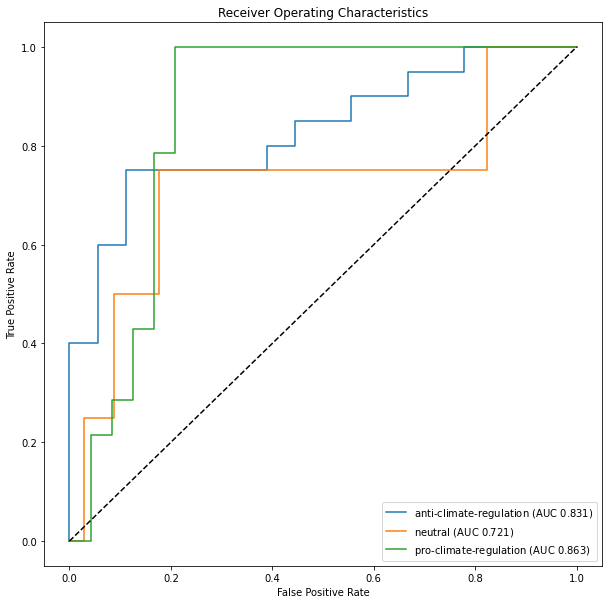

In [179]:
lucem_illud.plotMultiROC(logistic_l1, test_speech_df)

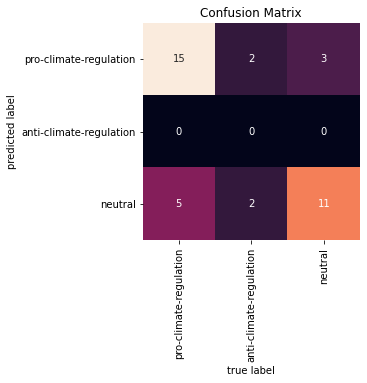

In [180]:
lucem_illud.plotConfusionMatrix(logistic_l1, test_speech_df)

Above we can see the metrics of using a Logistic Regression model with L2 normalization. 
The classification algorithm is not very strong with only 68% accuracy on the test set. The AUC values are higher for
both anti and pro climate regulation and lower for neutral. Furthermore, we can see that the logistic classifier
mis labels all anti-climate-regulation samples in the training set while also labeling 5 pro-climate-regulation
speeches as neutral. Below we will see if the Naive Bayes classifier performs better.


In [182]:
# Multinomial Naive Bayes
print("Results using Multinomial Naive Bayes:")
print()
MultinomialNB = sklearn.naive_bayes.MultinomialNB()
MultinomialNB.fit(np.stack(train_speech_df['vect'], axis=0), train_speech_df['category'])
print("Training accuracy: {}".format(MultinomialNB.score(np.stack(train_speech_df['vect'], axis=0), train_speech_df['category'])))

print("Testing accuracy:{}".format(MultinomialNB.score(np.stack(test_speech_df['vect'], axis=0), test_speech_df['category'])))

Results using Multinomial Naive Bayes:

Training accuracy: 0.8782051282051282
Testing accuracy:0.6842105263157895


In [183]:
print()
print("Evaluation Metrics:")
lucem_illud.metrics.evaluateClassifier(MultinomialNB, test_speech_df)


Evaluation Metrics:


,Error_Rate,AUC,Precision,Average_Precision,Recall
Category,,,,,
pro-climate-regulation,0.263158,0.761905,0.600000,0.566917,0.857143
anti-climate-regulation,0.263158,0.738889,0.777778,0.702339,0.700000
neutral,0.105263,0.500000,0.000000,0.105263,0.000000


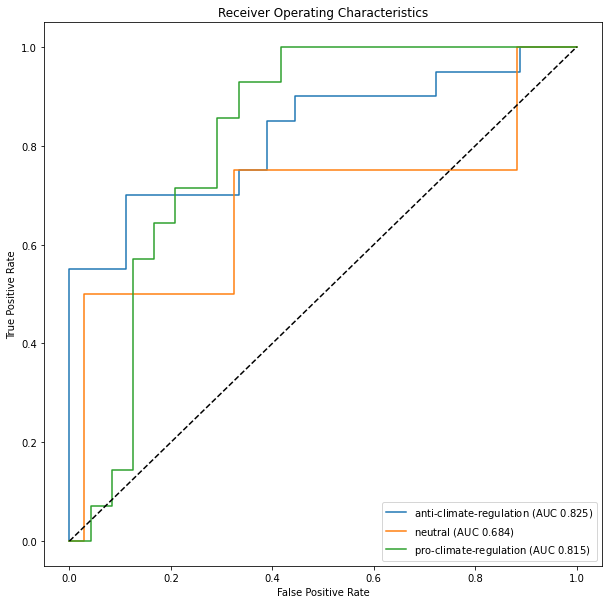

In [184]:
lucem_illud.plotMultiROC(MultinomialNB, test_speech_df)

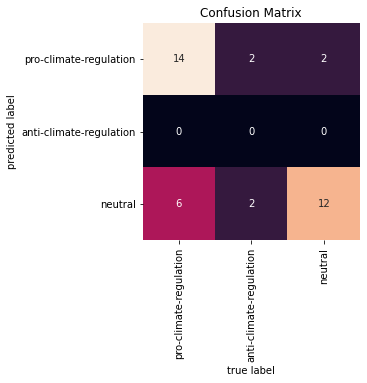

In [191]:
lucem_illud.plotConfusionMatrix(MultinomialNB, test_speech_df)

The results using Multinomial Bayes classification are similar to those achieved by the previous logistic clasification model.
The Naive Bayes classifier has around a 68% accuracy in the training set and also miss-classifier the anti-climate-regulation
speeches while mislabeling many of the pro-climate-regulation speeches as neutral. From the results of the above two
classification models we can speculate one of two things:
1. Niether Naive Bayes not Logistic Regression are well suited for our presidential speeches dataset
because of inherent characteristics of the distribution of words in our dataset.
2. Our dataset is not equally distributed among classes. It seems neutral speeches are much less common than pro or anti climate speeches.
We could adress this bias through different minority-sampling techniques such as SMOL.

In [192]:
speeches.groupby("climate_stance")["category"].count()

climate_stance
anti-climate-regulation    92
neutral                    19
pro-climate-regulation     83
Name: category, dtype: int64

# Decision Trees

Decision trees can be used to predict both categorical/class labels (i.e., classification) and continuous labels (i.e., regression).

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

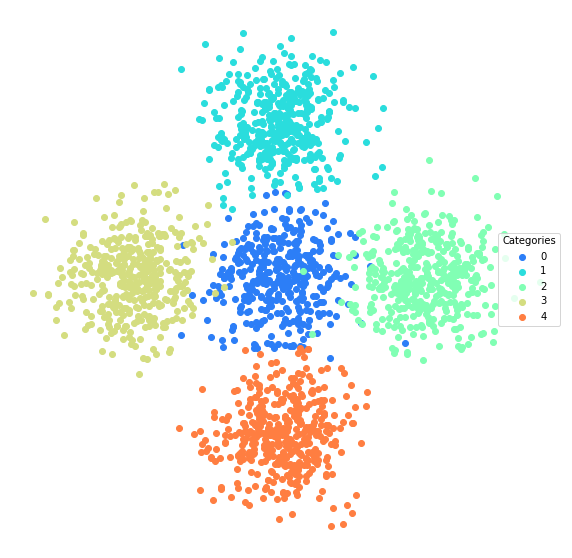

In [195]:
blobs_df = lucem_illud.multiBlobs(noise=.2, centers=[(0,0), (0,5), (5,0), (-5,0), (0,-5)])
df_exampleTree_train, df_exampleTree_test = lucem_illud.trainTestSplit(blobs_df)
lucem_illud.plotter(df_exampleTree_train)

Now we import our Decision Tree classifier from sklearn.tree (familiar syntax) and fit it using the fit method.

In [196]:
clf_tree = sklearn.tree.DecisionTreeClassifier(max_depth=4,random_state=0)
clf_tree.fit(np.stack(df_exampleTree_train['vect'], axis =0), df_exampleTree_train['category'])

DecisionTreeClassifier(max_depth=4, random_state=0)

To see what's going on visually with the classification: 

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

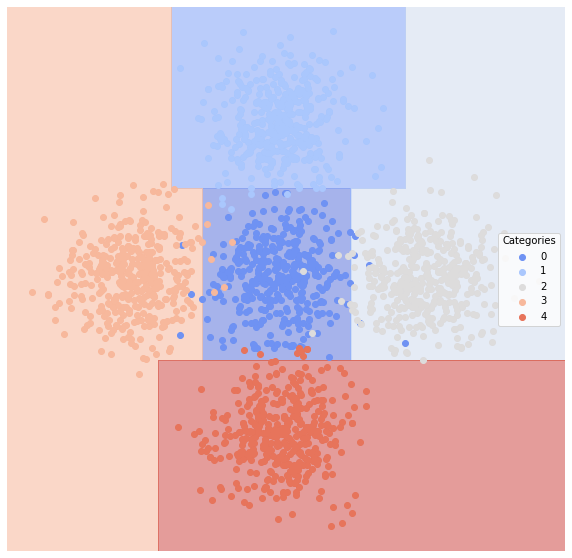

In [198]:
lucem_illud.plotregions(clf_tree, df_exampleTree_train)

In [197]:
lucem_illud.evaluateClassifier(clf_tree, df_exampleTree_test)

,Error_Rate,AUC,Precision,Average_Precision,Recall
Category,,,,,
0,0.014,0.984564,0.956140,0.942913,0.981982
1,0.004,0.989899,1.000000,0.983798,0.979798
2,0.012,0.973246,0.989362,0.948884,0.948980
3,0.002,0.994949,1.000000,0.991899,0.989899
4,0.008,0.995086,0.958763,0.958763,1.000000


Lets look at accuracy:

In [199]:
sklearn.metrics.accuracy_score(df_exampleTree_test['category'],clf_tree.predict(np.stack(df_exampleTree_test['vect'], axis = 0)))

0.98

What happens if we trim the tree?

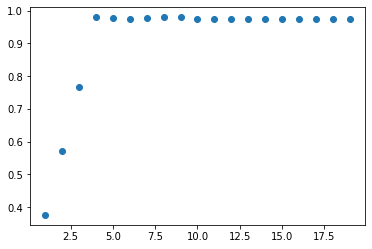

In [200]:
depthvec = []
scorevec = []
for i in range(1,20):
    tree2 = sklearn.tree.DecisionTreeClassifier(max_depth=i,random_state=0)
    tree2.fit(np.stack(df_exampleTree_train['vect'], axis =0), df_exampleTree_train['category'])
    score = sklearn.metrics.accuracy_score(df_exampleTree_test['category'], tree2.predict(np.stack(df_exampleTree_test['vect'], axis = 0)))
    depthvec.append(i)
    scorevec.append(score)
plt.scatter(depthvec,scorevec)
plt.show()

We can select different layers of the decision tree or "prune" it. At approximately four layers down in the decision tree, the shape is somewhat odd, suggesting that our model is overfitting beyond those four layers.

Combining multiple overfitting estimators turns out to be a key idea in machine learning. This is called **bagging** and is a type of **ensemble** method. The idea is to make many randomized estimators--each can overfit, as decision trees are wont to do--but then to combine them, ultimately producing a better classification. A **random forest** is produced by bagging decision trees.

In [201]:
tree = sklearn.tree.DecisionTreeClassifier(max_depth=10) #Create an instance of our decision tree classifier.

bag = sklearn.ensemble.BaggingClassifier(tree, n_estimators=100, max_samples=0.8, random_state=1) #Each tree uses up to 80% of the data

In [202]:
bag.fit(np.stack(df_exampleTree_train['vect'], axis =0), df_exampleTree_train['category']) #Fit the bagged classifier

BaggingClassifier(base_estimator=DecisionTreeClassifier(max_depth=10),
                  max_samples=0.8, n_estimators=100, random_state=1)

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

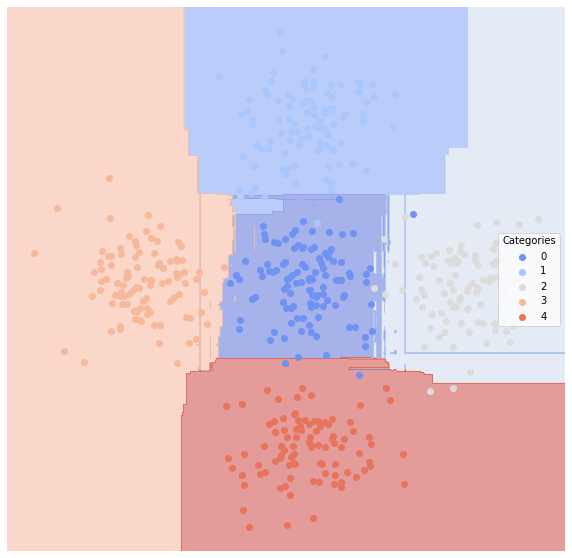

In [203]:
lucem_illud.plotregions(bag, df_exampleTree_test)

In [204]:
lucem_illud.evaluateClassifier(bag, df_exampleTree_test)

,Error_Rate,AUC,Precision,Average_Precision,Recall
Category,,,,,
0,0.014,0.981345,0.964286,0.944224,0.972973
1,0.004,0.989899,1.000000,0.983798,0.979798
2,0.010,0.978348,0.989474,0.957087,0.959184
3,0.000,1.000000,1.000000,1.000000,1.000000
4,0.008,0.995086,0.958763,0.958763,1.000000


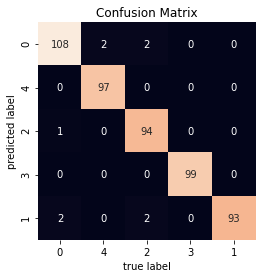

In [205]:
lucem_illud.plotConfusionMatrix(bag, df_exampleTree_test)

## <span style="color:red">*Exercise 3*</span>

<span style="color:red">In the cells immediately following, perform decision tree and random forest classification (binary, multinomial or continuous) using training, testing and extrapolation (uncoded) data from texts and hand-classifications associated with your final project. As with ***Exercise 2***, these could be crowd-sourced codes gathered through Amazon Mechanical Turk last week. Visualize the classification of data points. Calculate relevant metrics (e.g., precision, recall, the F-measure, and AUC). Now build an ensemble classifier by bagging trees into a random forest. Visualize the result. How do these classifiers perform? What does ensemble learning do?

In [208]:
# Decision Tree
print("Results using Decison Tree with max-depth=10:")
dec_tree = sklearn.tree.DecisionTreeClassifier(max_depth=10,random_state=0)
dec_tree.fit(np.stack(train_speech_df['vect'], axis =0), train_speech_df['category'])

print("Training accuracy: {}".format(dec_tree.score(np.stack(train_speech_df['vect'], axis=0), train_speech_df['category'])))
print("Testing accuracy:{}".format(dec_tree.score(np.stack(test_speech_df['vect'], axis=0), test_speech_df['category'])))


Results using Decison Tree with max-depth=10:
Training accuracy: 1.0
Testing accuracy:0.4473684210526316


In [209]:
lucem_illud.evaluateClassifier(dec_tree, test_speech_df)

,Error_Rate,AUC,Precision,Average_Precision,Recall
Category,,,,,
pro-climate-regulation,0.421053,0.577381,0.444444,0.411863,0.571429
anti-climate-regulation,0.473684,0.533333,0.571429,0.544361,0.400000
neutral,0.210526,0.551471,0.166667,0.120614,0.250000


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


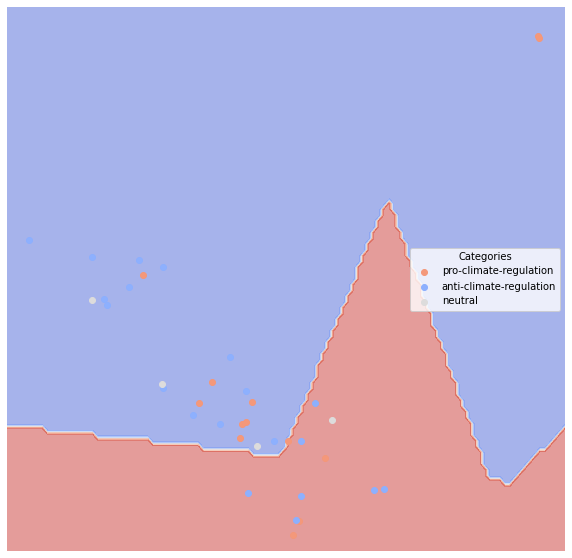

In [210]:
lucem_illud.plotregions(dec_tree, test_speech_df)

In [211]:
# Random Forest
print("Results using Random Forest:")
forest = sklearn.ensemble.RandomForestClassifier()
forest.fit(np.stack(train_speech_df['vect'], axis =0), train_speech_df['category'])

print("Training accuracy: {}".format(forest.score(np.stack(train_speech_df['vect'], axis=0), train_speech_df['category'])))
print("Testing accuracy:{}".format(forest.score(np.stack(test_speech_df['vect'], axis=0), test_speech_df['category'])))

Results using Random Forest:
Training accuracy: 1.0
Testing accuracy:0.6842105263157895


In [213]:
lucem_illud.evaluateClassifier(forest, test_speech_df)

,Error_Rate,AUC,Precision,Average_Precision,Recall
Category,,,,,
pro-climate-regulation,0.236842,0.738095,0.692308,0.576634,0.642857
anti-climate-regulation,0.289474,0.702778,0.680000,0.656947,0.850000
neutral,0.105263,0.500000,0.000000,0.105263,0.000000


Above we see the results of using a Decision Tree with a max-depth of 10 nodes and a Random Forest Classifier.
The decision tree classifier performs no better than chance in the testing set with an accuracy of .44 
while the Random Forest performs much better than the decision tree it performs around the same as the
logistic regression and naive bayes algorithms tested before. 

In [217]:
# Ensemble by bagging
tree = sklearn.tree.DecisionTreeClassifier(max_depth=20) 
ensemble_bag = sklearn.ensemble.BaggingClassifier(tree, n_estimators=200, max_samples=0.8, random_state=1) 

ensemble_bag.fit(np.stack(train_speech_df['vect'], axis =0), train_speech_df['category'])

print("Training accuracy: {}".format(ensemble_bag.score(np.stack(train_speech_df['vect'], axis=0), train_speech_df['category'])))
print("Testing accuracy:{}".format(ensemble_bag.score(np.stack(test_speech_df['vect'], axis=0), test_speech_df['category'])))

Training accuracy: 1.0
Testing accuracy:0.5263157894736842


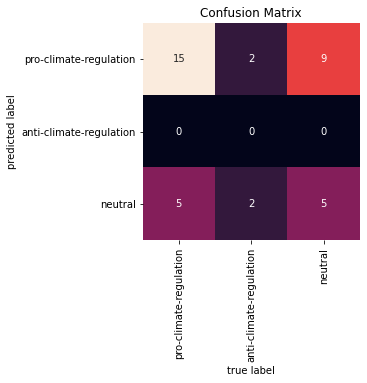

In [218]:
lucem_illud.plotConfusionMatrix(ensemble_bag, test_speech_df)

As we see above the ensemble method through bagging does not perform much better than the decision tree
and performs worse than the sklearn random forest. It seems the ensemble method is mis classifying neutral
speeches as pro-climate-regulation.

The ensemble method through bagging uses repeated trees and growth parallely 
in order to build a more complex forest for classification decisison. 

# K-Nearest Neighbors

The K-Nearest neighbors classifier takes a simpler premise than those before: Find the closest labeled datapoint in set and "borrow" its label.

Let's use newsgroup data again.

In [219]:
newsgroupsDF[:5]

,text,category,source_file,tokenized_text,normalized_text
0,\n\nParadise and salvation are not the same th...,talk.religion.misc,../data\20news_home\20news-bydate-train\talk.r...,"[Paradise, and, salvation, are, not, the, same...","[paradise, salvation, thing, salvation, well, ..."
1,\nYou're admitting a lot more than that. You ...,talk.religion.misc,../data\20news_home\20news-bydate-train\talk.r...,"[You, 're, admitting, a, lot, more, than, that...","[admit, lot, admit, moral, situational, admit,..."
2,"\n\nJesus also recognized other holy days, lik...",talk.religion.misc,../data\20news_home\20news-bydate-train\talk.r...,"[Jesus, also, recognized, other, holy, days, l...","[jesus, recognize, holy, day, like, passover, ..."
3,In <lsjc8cINNmc1@saltillo.cs.utexas.edu> turpi...,talk.religion.misc,../data\20news_home\20news-bydate-train\talk.r...,"[In, <, lsjc8cINNmc1@saltillo.cs.utexas.edu, >...","[<, lsjc8cinnmc1@saltillo.cs.utexas.edu, >, tu..."
4,"\nI'm sorry, but He does not! Ever read the F...",talk.religion.misc,../data\20news_home\20news-bydate-train\talk.r...,"[I, 'm, sorry, but, He, does, not, Ever, read,...","[be, sorry, read, commandment]"


Make a testing and training set:

In [220]:
holdBackFraction = .2
train_ng_df, test_ng_df = lucem_illud.trainTestSplit(newsgroupsDF, holdBackFraction=holdBackFraction)

Let's initialize our k-nearest neighbors classifier:

In [221]:
n_neighbors = 15
weights="uniform"
clf_knearest = sklearn.neighbors.KNeighborsClassifier(n_neighbors, weights=weights)

Let's try to classify using the TF-IDF vectors:

In [222]:
TFVectorizer_ng = sklearn.feature_extraction.text.TfidfVectorizer(max_df=100, min_df=2, stop_words='english', norm='l2')
TFVects_ng = TFVectorizer_ng.fit_transform(train_ng_df['text'])
train_ng_df['vect'] = [np.array(v).flatten() for v in TFVects_ng.todense()]

In [223]:
clf_knearest.fit(np.stack(train_ng_df['vect'], axis = 0), train_ng_df['category'])

KNeighborsClassifier(n_neighbors=15)

In [225]:
lucem_illud.evaluateClassifier(clf_knearest, train_ng_df)

,Error_Rate,AUC,Precision,Average_Precision,Recall
Category,,,,,
sci.space,0.297737,0.614222,0.453089,0.349092,0.419492
talk.religion.misc,0.334881,0.640962,0.291732,0.247367,0.603226
comp.graphics,0.327916,0.632727,0.424342,0.356242,0.545455
soc.religion.christian,0.266396,0.518995,0.621622,0.288820,0.049145


And lets look at the testing data

In [226]:
#Create vectors
TFVects_test = TFVectorizer_ng.transform(test_ng_df['text'])
test_ng_df['vect'] = [np.array(v).flatten() for v in TFVects_test.todense()]

#Add to df
test_ng_df['nb_predict'] = clf_knearest.predict(np.stack(test_ng_df['vect'], axis=0))

#Test
print("Testing score:")
print(clf_knearest.score(np.stack(test_ng_df['vect'], axis=0), test_ng_df['category']))

Testing score:
0.2837209302325581


Let's produce another confusion matrix:

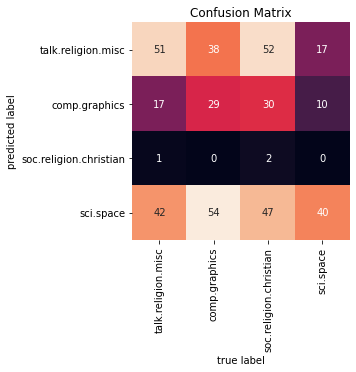

In [228]:
lucem_illud.plotConfusionMatrix(clf_knearest, test_ng_df)

You can produce the PCA space visual if you want, altough it can take a very long time, so we'll leave it optionally commented out:

In [ ]:
#lucem_illud_2020.plotregions(clf_knearest, test_ng_df)

## <span style="color:red">*Exercise 4*</span>

<span style="color:red">In the cells immediately following, perform and visualize k-nearest neighbor classification using training, testing and extrapolation (uncoded) data from texts and hand-classifications associated with your final project. Visualize the classification of data points and calculate relevant metrics (e.g., precision, recall, the F-measure, and AUC). Articulate how the *k*-nearest neighbor approach relates to *k*-means clustering explored in ***week 3***?


- NOTE: It seems the question pertaining to k-means was from a previous year in which unsupervised learning was covered 
in week 3, which was not the case this year.

In [231]:
n_neighbors = 5
weights="uniform"
knearest_neigh = sklearn.neighbors.KNeighborsClassifier(n_neighbors, weights=weights)

In [243]:
# Random Forest
print("Results using K Nearest Neighbors (k=5):")
n_neighbors = 3
weights="uniform"
knearest_neigh = sklearn.neighbors.KNeighborsClassifier(n_neighbors, weights=weights)

knearest_neigh.fit(np.stack(train_speech_df['vect'], axis =0), train_speech_df['category'])

print("Training accuracy: {}".format(knearest_neigh.score(np.stack(train_speech_df['vect'], axis=0), train_speech_df['category'])))
print("Testing accuracy:{}".format(knearest_neigh.score(np.stack(test_speech_df['vect'], axis=0), test_speech_df['category'])))

Results using K Nearest Neighbors (k=5):
Training accuracy: 0.8782051282051282
Testing accuracy:0.7368421052631579


In [245]:
lucem_illud.evaluateClassifier(knearest_neigh, test_speech_df)

,Error_Rate,AUC,Precision,Average_Precision,Recall
Category,,,,,
pro-climate-regulation,0.184211,0.824405,0.705882,0.657674,0.857143
anti-climate-regulation,0.236842,0.763889,0.789474,0.723684,0.750000
neutral,0.105263,0.610294,0.500000,0.203947,0.250000


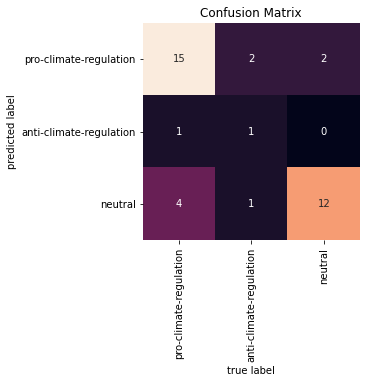

In [244]:
lucem_illud.plotConfusionMatrix(knearest_neigh, test_speech_df)

Surprisingly, despite it simplicity, K neares neighbors with k=3 performs better than all classification algorithms
performed so far. Unlike the previous classification models performed K-nearest neighbors does not misclasigy as many
neutral samples in the training set and correctly classifies one anti-climate sample.

This could be due to the inherent complexity and multi-dimensional nature of our dataset.


# SVMs

Now we will examine Support Vector Machines, an approach that creates the partition that preserves the "maximum margin" between classes.

We will use a few sub forums from reddit--which tend to share text rather than memes--namely `talesfromtechsupport`, `badroommates`, `weeabootales` and `relationships`. The top 100 text posts from each have been saved to `data/reddit.csv`.

In [ ]:
redditDf = pandas.read_csv('../data/reddit.csv', index_col = 0)

#Drop a couple missing values

redditDf = redditDf.dropna()

#Set category

redditDf['category'] = redditDf['subreddit']

#tokenize and normalize
redditDf['tokenized_text'] = redditDf['text'].apply(lambda x: lucem_illud_2020.word_tokenize(x))
redditDf['normalized_text'] = redditDf['tokenized_text'].apply(lambda x: lucem_illud_2020.normalizeTokens(x))

We will tf.idf the data to make our vectors:

In [ ]:
redditTFVectorizer = sklearn.feature_extraction.text.TfidfVectorizer(max_df=0.5, min_df=3, stop_words='english', norm='l2')
redditTFVects = redditTFVectorizer.fit_transform([' '.join(l) for l in redditDf['normalized_text']])
redditDf['vect'] = [np.array(v).flatten() for v in redditTFVects.todense()]

Initilize the model and make a train test split:

In [ ]:
holdBackFraction = .2
train_redditDf, test_redditDf = lucem_illud_2020.trainTestSplit(redditDf, holdBackFraction=holdBackFraction)

In [ ]:
clf_svm = sklearn.svm.SVC(kernel='linear', probability = False)
#probability = True is slower but  lets you call predict_proba()
clf_svm.fit(np.stack(train_redditDf['vect'], axis=0), train_redditDf['category'])

...and consider the results:

In [ ]:
lucem_illud_2020.evaluateClassifier(clf_svm, test_redditDf)

In [ ]:
lucem_illud_2020.plotConfusionMatrix(clf_svm, test_redditDf)

In [ ]:
lucem_illud_2020.plotregions(clf_svm, test_redditDf)

# Neural Nets

We include an example of a simple neural network, the Multi-layer Perceptron (MLP) that learns a function $f(\cdot): R^m \rightarrow R^o$ by training on a dataset, where $m$ is the number of dimensions for input and $o$ is the number of dimensions for output. Given a set of features $X = {x_1, x_2, ..., x_m}$ and a target $y$, it can learn a non-linear function approximator for either classification or regression. It is different from logistic regression, in that between the input and the output layer, there can be one or more non-linear layers, called hidden layers. The following figure shows a one hidden layer MLP with scalar output. ![title](../data/multilayerperceptron_network.png) The leftmost layer, known as the input layer, consists of a set of "neurons" $\{x_i | x_1, x_2, ..., x_m\}$ representing the input features (e.g., weighted words). Each neuron in the hidden layer transforms the values from the previous layer with a weighted linear summation $w_1x_1 + w_2x_2 + ... + w_mx_m$, followed by a non-linear activation function $g(\cdot):R \rightarrow R$ - like the logistic or hyperbolic tan function. The output layer receives the values from the last hidden layer and transforms them into output values.

In [ ]:
clf_nn = sklearn.neural_network.MLPClassifier()
clf_nn.fit(np.stack(train_redditDf['vect'], axis=0), train_redditDf['category'])

In [ ]:
lucem_illud_2020.evaluateClassifier(clf_nn, test_redditDf)

In [ ]:
lucem_illud_2020.plotConfusionMatrix(clf_nn, test_redditDf)

In [ ]:
lucem_illud_2020.plotregions(clf_nn, test_redditDf)

It performs very well.

## <span style="color:red">*Exercise 5*</span>

<span style="color:red">In the cells immediately following, perform a neural network classification and calculate relevant metrics (e.g., precision, recall, the F-measure, and AUC). How does this classify relevant to *k*-nearest neighbor, Naive Bayes, logistic and decision-tree approaches?